# Sieć służąca do klasyfikacji pastylek leków - analiza aktywacji
Wykonał Bartłomiej Tarcholik

In [11]:
import json
import numpy as np
import tensorflow as tf
import random
from keras import layers
from keras import models
from keras.models import load_model
from matplotlib import pyplot as plt
from tensorflow.keras import backend as K

resultList = []
for i in range(5):
  model = load_model('C:/ml/models/pills_final_ranking/' + str(i + 1) + '.h5')
  with open('C:/ml/models/pills_final_ranking/' + str(i + 1) + '.json') as user_file:
    file_contents = user_file.read()
  data = json.loads(file_contents)
  resultList.append([
    model,
    data[0],
    data[1],
    data[2],
    data[3],
    data[4],
    data[5]
  ])

In [13]:
def RandomColor():
    random_number = random.randint(0, 16777215)
    hex_number = str(hex(random_number))
    return '#' + f'{"%06x" % random.randint(0, 0xFFFFFF)}'


def PlotAccuracyComparison(m_list):
    plt.clf()
    plt.figure(figsize=(25, 15))
    for m in m_list:
        r_color = m[6]
        name = m[1]
        history = m[2]
        accuracy = history['acc']
        validation_accuracy = history['val_acc']
        epochs = range(len(accuracy))
        plt.plot(epochs, validation_accuracy, label ='Validation accuracy: ' + str(round(m[3] * 100, 2)) +' for ' + name, color=r_color)
        plt.plot(epochs, accuracy, 'o', label ='Training accuracy: ' + str(round(m[4] * 100, 2)) +' for ' + name, color=r_color)
    plt.title('Comparison of Training and Validation Accuracies')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend(bbox_to_anchor=(1.1, 1.05))
    plt.show()


def PlotLossComparison(m_list):
    plt.clf()
    plt.figure(figsize=(25, 15))
    for m in m_list:
        r_color = m[6]
        name = m[1]
        history = m[2]
        loss = history['loss']
        validation_loss = history['val_loss']
        epochs = range(len(loss))
        plt.plot(epochs, loss, 'o', label='Training loss for ' + name, color=r_color)
        plt.plot(epochs, validation_loss, label='Validation loss for ' + name, color=r_color)
    plt.title('Comparison of Training and Validation Losses')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend(bbox_to_anchor=(1.0, 1.0))
    plt.show()

Na początek wybieram 5 najlepszych modeli, oto jak się ze sobą porównują:

<Figure size 432x288 with 0 Axes>

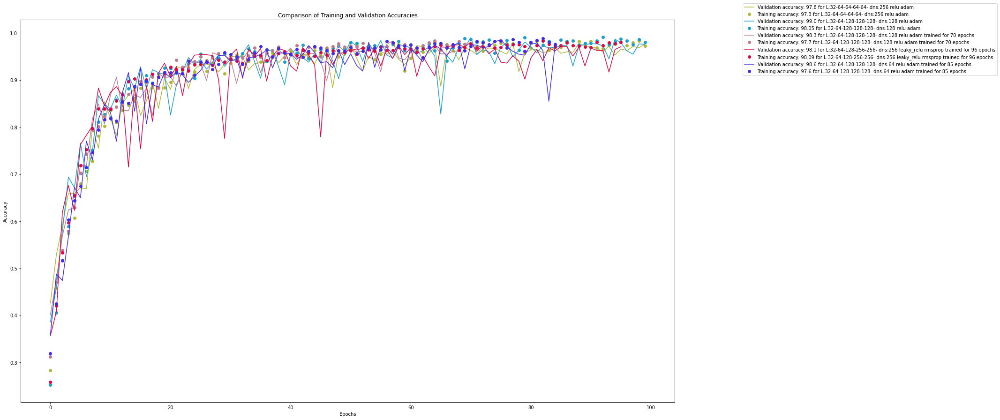

In [14]:
PlotAccuracyComparison(resultList)

<Figure size 432x288 with 0 Axes>

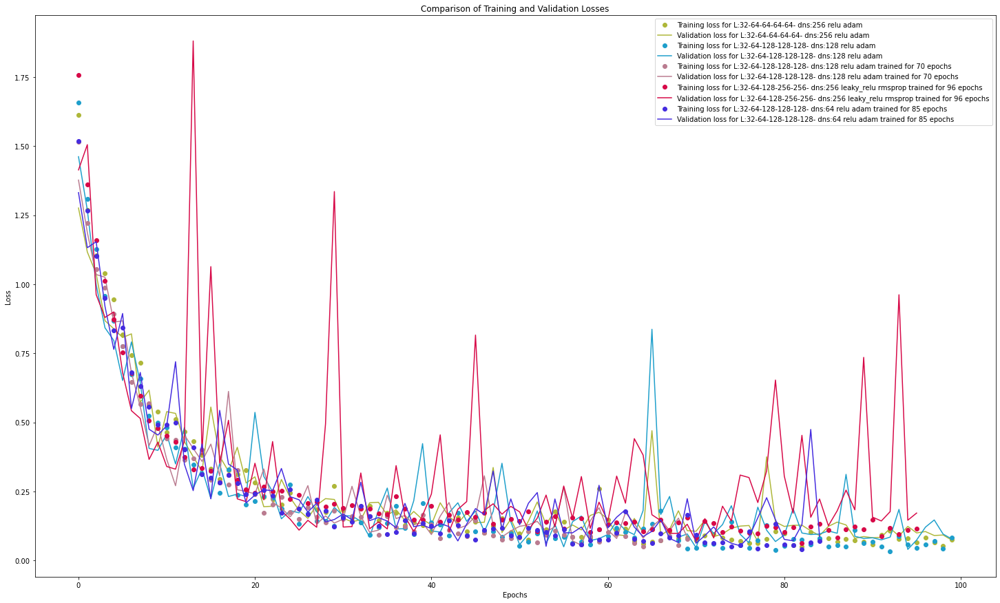

In [15]:
PlotLossComparison(resultList)

In [7]:
from tensorflow.keras.preprocessing import image
final_dir = 'C:/ml/data/pills/final/'

def Show1(entry, i, img_tensor):
    # img = image.load_img(img_path, target_size=(64, 64))
    # img_tensor = image.img_to_array(img)
    # img_tensor = np.expand_dims(img_tensor, axis=0)
    # img_tensor /= 255.
    model = entry[0]
    layer_outputs = [layer.output for layer in model.layers]
    activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(img_tensor)
    layer_names = []
    for layer in model.layers[:8]:
        layer_names.append(layer.name)

    images_per_row = 16
    grids = []

    for layer_name, layer_activation in zip(layer_names, activations):
        n_features = layer_activation.shape[-1]

        size = layer_activation.shape[1]

        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, size * images_per_row))

        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row] 
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image
        grids.append([display_grid, size, layer_name])
    return grids

In [ ]:
testList = ["/capsule/64.jpg", "/flat-capsule/68.jpg", "/oval/45.jpg", "/oval-capsule/17.jpg", "/round/83.jpg", "/square/27.jpg"]
tensorList = []
for img in testList:
    img = image.load_img(final_dir + img, target_size=(64, 64))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    tensorList.append(img_tensor)

i = 0
for entry in resultList:
    i += 1
    results = {}
    for tns, im_namme in zip(tensorList, testList):
        grids = Show1(entry, i, tns)
        results[im_namme] = grids
    if len(entry) > 7:
        entry[7] = results
    else:
        entry.append(results)

Na wybranym zdjęciu z każdej klasy sprawdzam jak wyglądają aktywacje.

## Wnioski z analizy aktywacji
Możemy zobaczyć, że "najlepsza" (1 warstwa Conv2d z 32 neuronami oraz 4 warstwy po 64 neurony, 256 neuronów gęstych, funkcja aktywacji ReLU oraz optymalizator Adam) sieć posiada bardzo wiele kompletnie martwych aktywacji. Dla każdej klasy aktywują się właściwie te same filtry, a spora część z nich praktycznie nic nie wykrywa. Jeśli chodzi o jej "argumentację", to można zauważyć, że tam, gdzie dostajemy jakiś ciekawy wynik, jest to najczęściej słusznie argumentowane. Niemniej jednak nie jestem przekonany odnośnie skuteczności tego modelu.

Model drugi (1 warstwa Conv2d z 32 neuronami, 1 z 64 neuronami oraz 3 warstwy po 128 neuronów, 128 neuronów gęstych, funkcja aktywacji ReLU oraz optymalizator Adam) sprawuje się podobnie jak pierwszy, lecz większe znaczenie mają często krawędzie, oświetlenie lub wypełnienie tabletki, a mniej znaczący jest "całkowity" obraz. Możliwe, że na potrzeby naszego modelu taka sieć okazałaby się lepsza.

Trzecia najlepsza sieć (1 warstwa Conv2d z 32 neuronami, 1 z 64 neuronami oraz 3 warstwy po 128 neuronów, 128 neuronów gęstych, funkcja aktywacji ReLU oraz optymalizator Adam, trenowana przez 70 epok) ma podobny problem jak pierwsze dwie sieci - bardzo dużo martwych aktywacji. Najczęściej model szuka krawędzi, co może być dobrym pomysłem na dłuższą metę. Niektóre aktywacje przedstawiają szukanie nie tyle samego kształtu, ale rozpoznanie go po tym jakiego kształtu "brakuje" w tle.

Sieć czwarta (1 warstwa Conv2d z 32 neuronami, 1 z 64 neuronami, 1 z 128 neuronami oraz 2 warstwy po 256 neuronów, 256 neuronów gęstych, funkcja aktywacji Leaky ReLU oraz optymalizator RMSProp, trenowana przez 96 epok) kompletnie zarzuca martwe aktywacje dzięki użyciu funkcji ReLu, lecz bardzo wiele z nich wykrywa dokładnie te same cechy.

Sieć piąta (1 warstwa Conv2d z 32 neuronami, 1 z 64 neuronami oraz 3 warstwy po 128 neuronów, 64 neuronów gęstych, funkcja aktywacji ReLU oraz optymalizator Adam, trenowana przez 85 epok) wygląda na najbardziej "martwą". Wiele aktywacji pokazuje jedynie jedną krawędź oraz ogólnie wiele pokrywających się cech.

C:\Users\creep\AppData\Local\Temp\ipykernel_10524\1410320409.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(len(testList), 1, figsize=(len(testList) * scale * display_grid.shape[1], scale * display_grid.shape[0]))


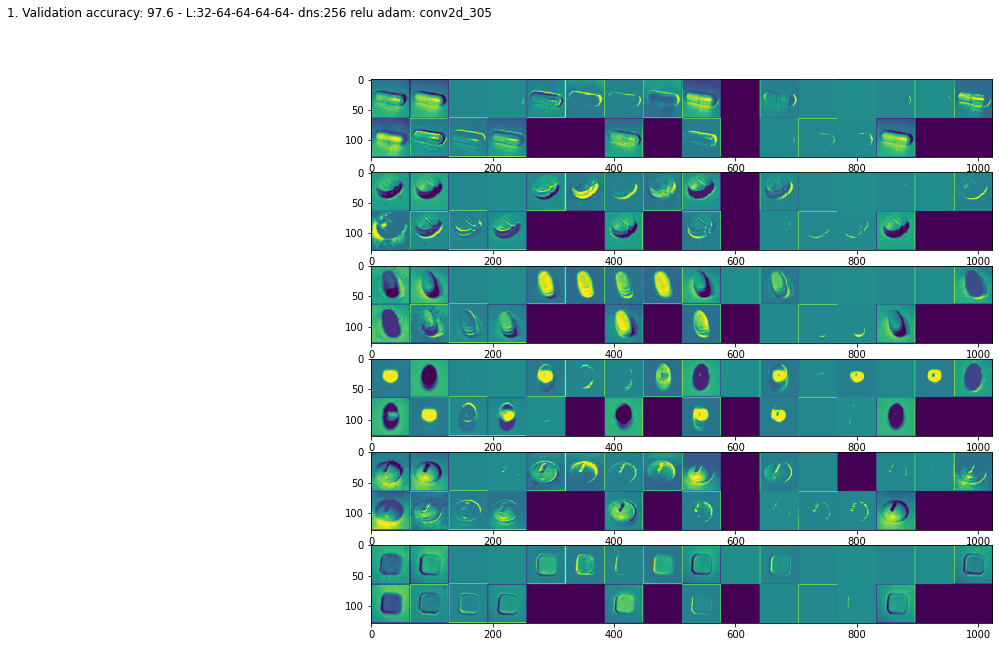

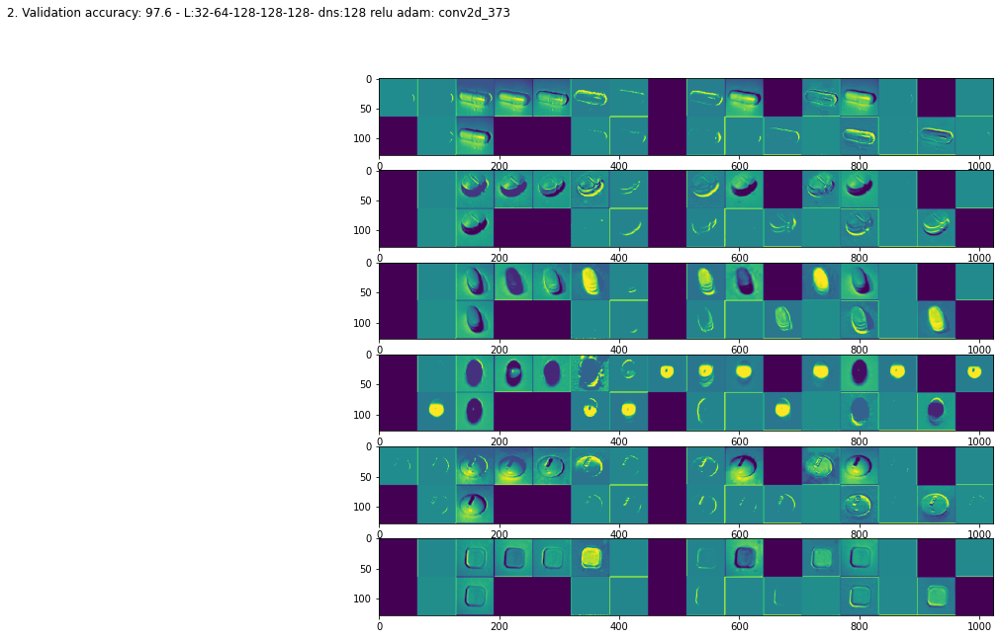

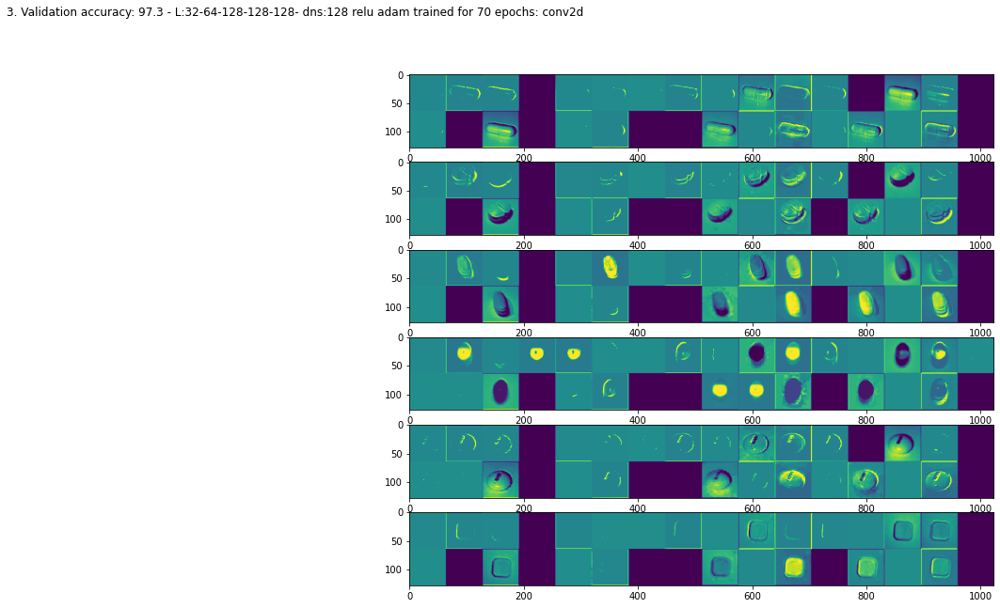

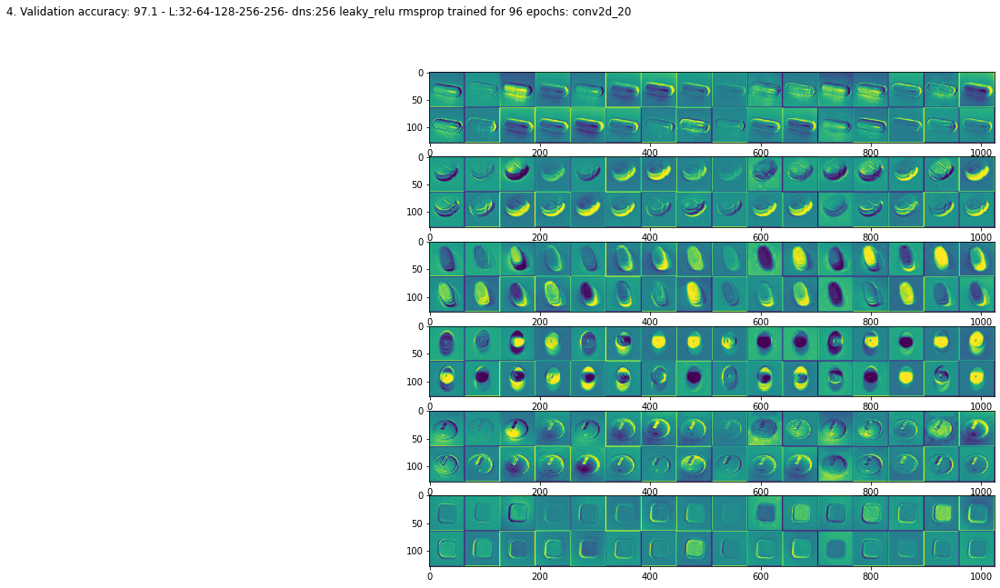

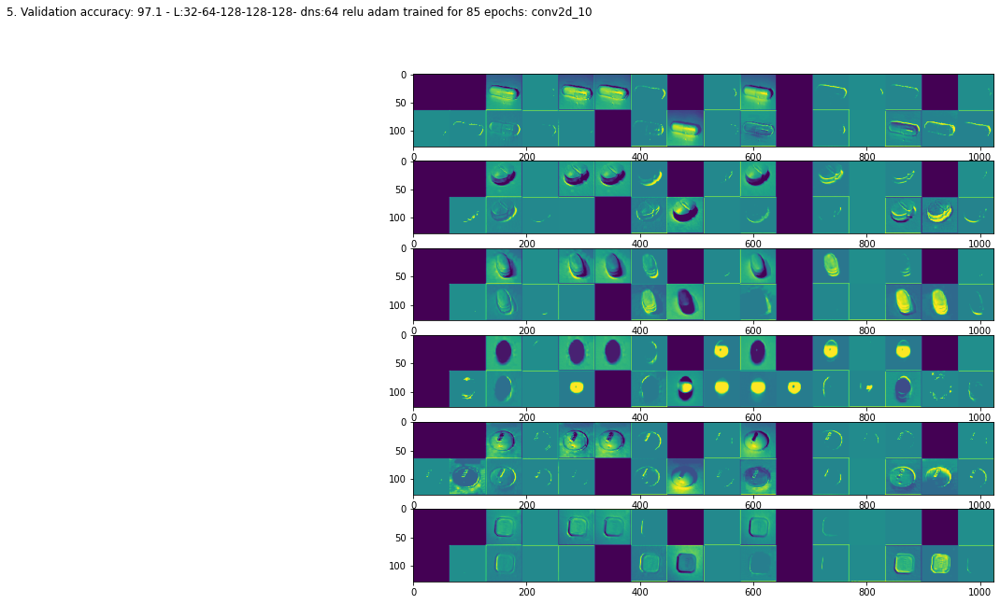

...

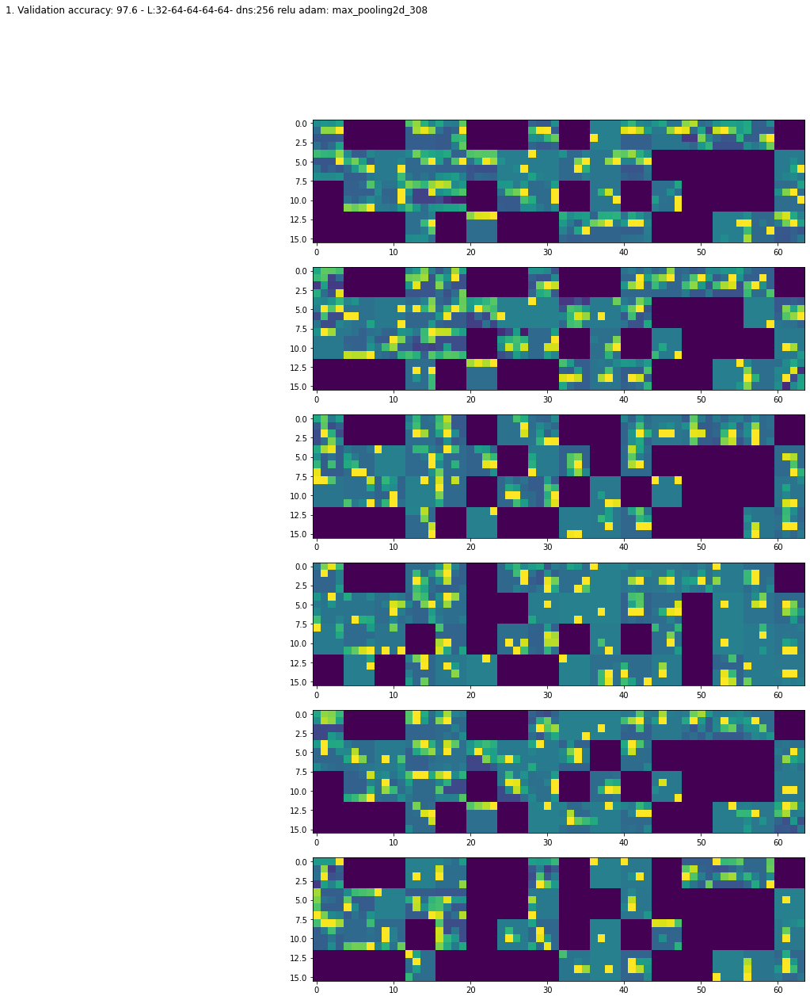

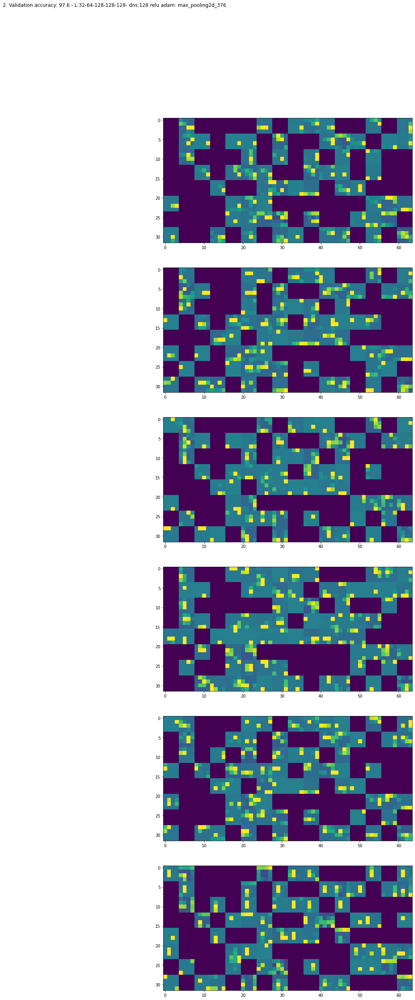

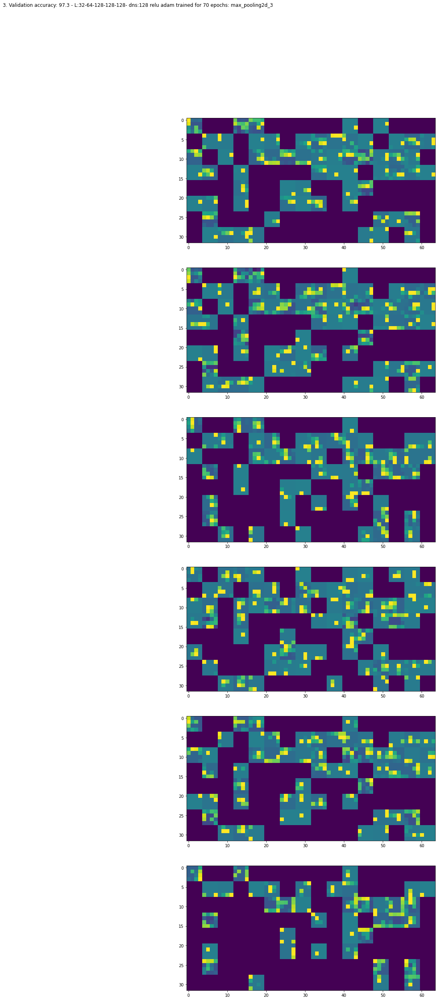

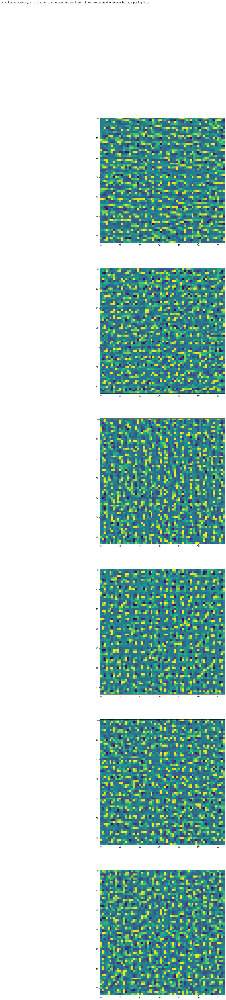

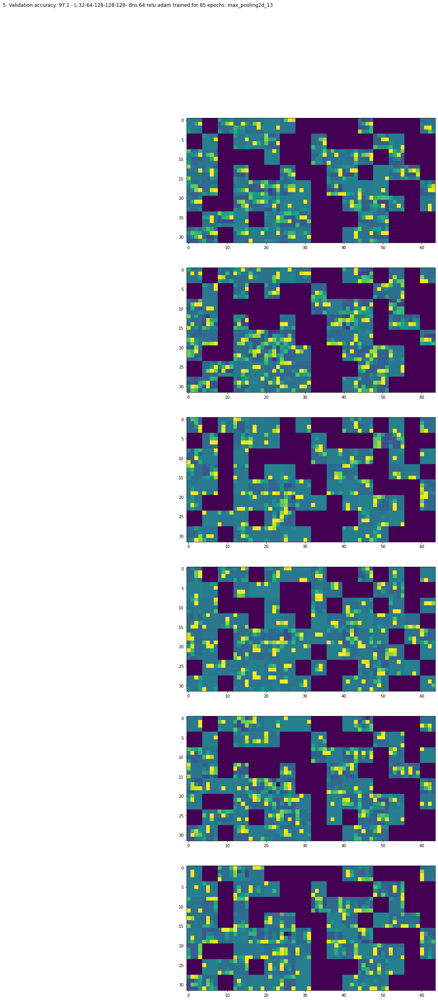

In [10]:

for layer_index in range(8):
  i = 1
  for entry in resultList:
    activationData = []
    toDisplay = []
    for key, value in entry[7].items():
      image_name = key
      grids = value[layer_index]
      display_grid = grids[0]
      size = grids[1]
      layer_name = grids[2]
      toDisplay.append([image_name, display_grid, size, layer_name])
    scale = 5 / size
    fig, ax = plt.subplots(len(testList), 1, figsize=(len(testList) * scale * display_grid.shape[1], scale * display_grid.shape[0]))
    fig.suptitle(str(i) + ". Validation accuracy: " + str(round(entry[2]['val_acc'][-1] * 100, 2)) + " - " + entry[1] + ": " + layer_name)
    for y in range(len(toDisplay)):
      x = toDisplay[y]
      image_name = x[0]
      display_grid = x[1]
      size = x[2]
      layer_name = x[3]
      ax[y].grid(False)
      ax[y].imshow(display_grid)
    i += 1